# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 13.03.2021

Мягкий дедлайн: 28.03.2021 01:59 MSK

Жёсткий дедлайн: 01.04.2021 01:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning. 



In [3]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [7]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''
        d = X.sum(axis=1)
        D = np.diag(d)
        L = D - X
        w, v = np.linalg.eig(L)
        w2idx = sorted([*enumerate(w)], key=lambda x: x[1])
        idx = [i for i, _ in w2idx[:self.n_components]]
        eigenvectors = np.real(v[:, idx].reshape(X.shape[0], self.n_components))
        assert eigenvectors.shape == (X.shape[0], self.n_components)
        return eigenvectors

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [8]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Если вдруг сайт Правительства Москвы сойдет с ума, то возьмите какую-нибудь версию данных [отсюда](https://data.mos.ru/opendata/7704786030-city-surface-public-transport-stops). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [9]:
data = pd.read_excel('transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
del data["index"]
data.head()

,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [10]:
!pip install -q folium

In [15]:
import folium

map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=30).add_to(map)
map

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [16]:
def stop_sort(array, data):
    '''
    sorts stops of a given rout
    '''

    sorted_list = []
    d_of_stops = []
    for i in array:
        coords = data[['Longitude_WGS84_en', 'Latitude_WGS84_en']][data.index==i].values[0]
        x, y = coords[0], coords[1]
        dist = 0.0
        for j in array:
            d_coords = data[['Longitude_WGS84_en', 'Latitude_WGS84_en']][data.index==j].values[0]
            a, b = d_coords[0], d_coords[1]
            d = np.sqrt((x - a)**2 + (y - b)**2)
            dist += d
        d_of_stops += [(i, dist)]

        d_of_stops.sort(reverse=True, key=lambda x: x[1])
        first = d_of_stops[0][0]
    sorted_list.append(first)

    while len(sorted_list) != len(array):
      curr_stop = sorted_list[-1]
      curr_coords = data[['Longitude_WGS84_en', 'Latitude_WGS84_en']][data.index==curr_stop].values[0]
      x, y = curr_coords[0], curr_coords[1]
      min_dist = (0, np.inf)
      for stop in array:
          if stop not in sorted_list:
             d_coords = data[['Longitude_WGS84_en', 'Latitude_WGS84_en']][data.index==stop].values[0]
             a, b = d_coords[0], d_coords[1]
             d = np.sqrt((x - a)**2 + (y - b)**2)
             if min_dist[1] > d: min_dist = (stop, d)
      sorted_list.append(min_dist[0])
    return sorted_list

def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''

    idx_bus = data[['RouteNumbers_en']]
    routes = {}
    for i in range(1037):
        buses = idx_bus.iloc[i][0]
        for bus in buses.split('; '):
            if bus in routes:
               routes[bus] += [i]
            else: 
               routes[bus] = [i]
    return routes


def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''
    for key in routes:
        routes[key] = stop_sort(routes[key], data)
    return routes


def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''
    n_samples = len(data)
    X = np.zeros((n_samples, n_samples))

    for key in sorted_routes:
        stops = sorted_routes[key]
        for i, j in zip(stops[:-1], stops[1:]):
            X[i, j] = +1
            X[j, i] = +1
            
    return X

In [385]:
from time import time 

In [ ]:
%%time
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [9]:
map = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=15):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords).add_to(map)

map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [10]:
COLORS = [
    'red',
    'blue',
    'gray',
    'darkred',
    'lightred',
    'orange',
    'beige',
    'darkgreen',
    'lightgreen',
    'darkblue',
    'lightblue',
    'purple',
    'darkpurple',
    'cadetblue',
    'lightgray',
    'black',
    'pink',
    'green',
]

In [11]:
def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''

    map = folium.Map([55.75215, 37.61819], zoom_start=11, min_zoom=10, max_zoom=13)
    for id, row in data.iterrows():
        folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10, color=COLORS[labels[id]]).add_to(map)
        
    return map

**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации K-Means и DBSCAN из `sklearn` на координатах остановок, а также свою реализацию спектральной кластеризации на построенной выше матрице смежности. Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`. Подберите параметры алгоритмов (`n_clusters` у K-Means, `eps` у DBSCAN, `n_clusters` и `n_components` у спектральной кластеризации) так, чтобы получить наиболее характерный для этих алгоритмов результат кластеризации (можете поэкспериментировать и оставить в ноутбуке картинки только для итоговых значений параметров, также обратите внимание на баланс объектов в кластерах). Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [12]:
from sklearn.cluster import KMeans, DBSCAN 

In [51]:
dbscan = DBSCAN(eps=0.004)
labels_dbscan = dbscan.fit_predict(data[['Longitude_WGS84_en', 'Latitude_WGS84_en']]) 
draw_clustered_map(data, labels_dbscan)

In [32]:
kmeans = KMeans(n_clusters=18)
kmeans_labels = kmeans.fit_predict(data[['Longitude_WGS84_en', 'Latitude_WGS84_en']])

In [33]:
draw_clustered_map(data, kmeans_labels)

In [54]:
graph_clustering = GraphClustering(n_clusters=18, n_components=10)
labels = graph_clustering.fit_predict(adjacency_matrix)

In [55]:
draw_clustered_map(data, labels)

Проинтерпретируйте полученные результаты. Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:** 
DBSCAN фокусируется на плотности и ищет соответственно наиболее плотно скопившиеся остановки, поэтому он выделяет центр как один кластер, так как там очень высокая плотность становок. Ну и соответстренно также DBSCAN может выделять остановки соглсно отдельным улицам/ маршрутам, так как в таком случае останки рассположены наиболее плотно.
KMeans просто выдает группы наиболее близко расположенных друг к другу остановок, при том не учитывая особенности выборки (количество маршрутов между остановками). Спектральная кластеризаия позволяет учесть подобные особенности и выделяет классы не на основании физической близости, а на основании соедененности остановок маршрутами, что является более релевантным в данном случае подходом.


## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [19]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
2156,tech,333.txt,US woman sues over ink cartridges,"A US woman is suing Hewlett Packard (HP), say..."
347,business,348.txt,US to probe airline travel chaos,The US government is to investigate two airli...
1302,politics,407.txt,Boateng to step down at election,"Paul Boateng, Chief Secretary to the Treasury..."
244,business,245.txt,The 'ticking budget' facing the US,The budget proposals laid out by the administ...
2036,tech,213.txt,Search sites get closer to users,Search sites want to get to know you better. ...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [20]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [21]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/tamogasevkirill/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/tamogasevkirill/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/tamogasevkirill/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [22]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [23]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

In [24]:
del data['raw_text']
del data['title']
del data['content']

In [25]:
data.head()

,category,filename,text
0,business,001.txt,ad sale boost time warner profit quarterly pro...
1,business,002.txt,dollar gain greenspan speech dollar hit highes...
2,business,003.txt,yukos unit buyer face loan claim owner embattl...
3,business,004.txt,high fuel price hit ba profit british airway b...
4,business,005.txt,pernod takeover talk lift domecq share uk drin...


Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [145]:
!pip install -q wordcloud

In [26]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=800, height=350):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

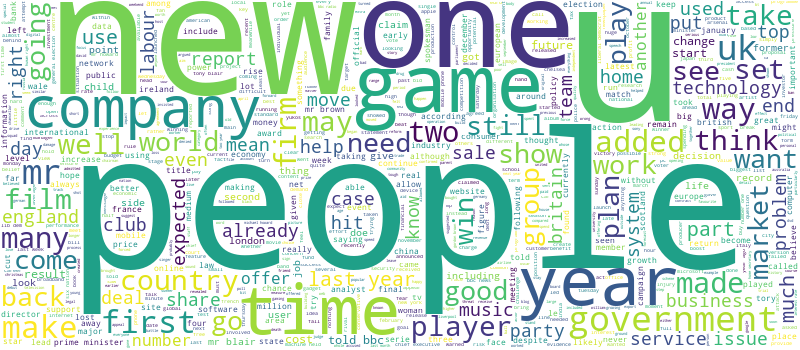

In [27]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

In [30]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(min_df=10)
X = tfidf.fit_transform(data['text'])

In [35]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=8)
labels_kmeans = kmeans.fit_predict(X)

In [36]:
data['KMeans'] = labels_kmeans
data.head()

,category,filename,text,KMeans
0,business,001.txt,ad sale boost time warner profit quarterly pro...,1
1,business,002.txt,dollar gain greenspan speech dollar hit highes...,6
2,business,003.txt,yukos unit buyer face loan claim owner embattl...,1
3,business,004.txt,high fuel price hit ba profit british airway b...,1
4,business,005.txt,pernod takeover talk lift domecq share uk drin...,1


'Politics'

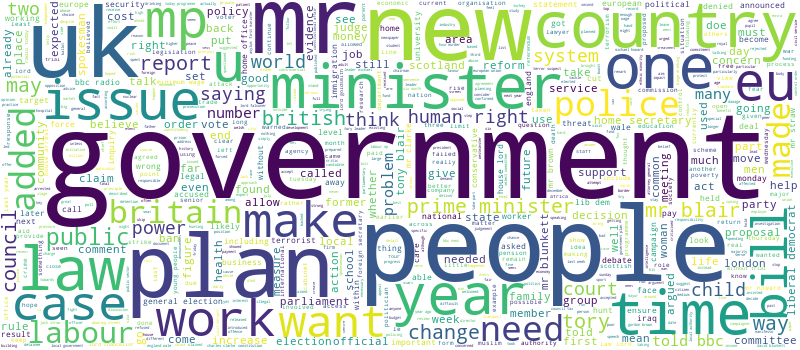

In [85]:
draw_wordcloud(data.text[data['KMeans'] == 0])

'British political system'

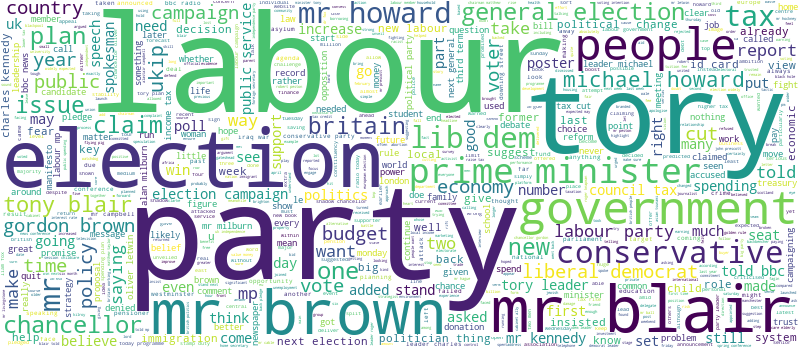

In [86]:
draw_wordcloud(data.text[data['KMeans'] == 5])

Озоглавим как 'Thechnology'

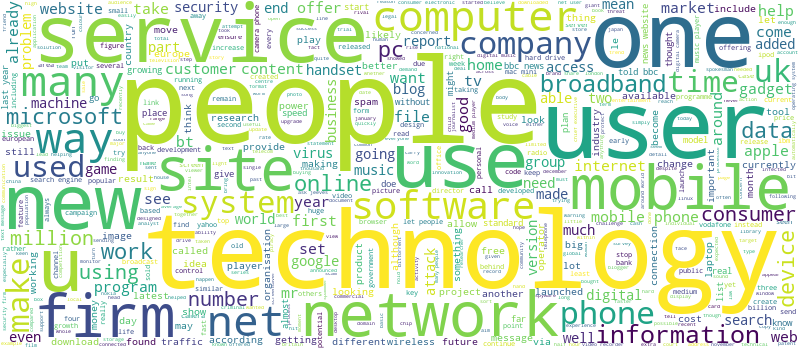

In [87]:
draw_wordcloud(data.text[data['KMeans'] == 3])

озоглавим как 'Sport'

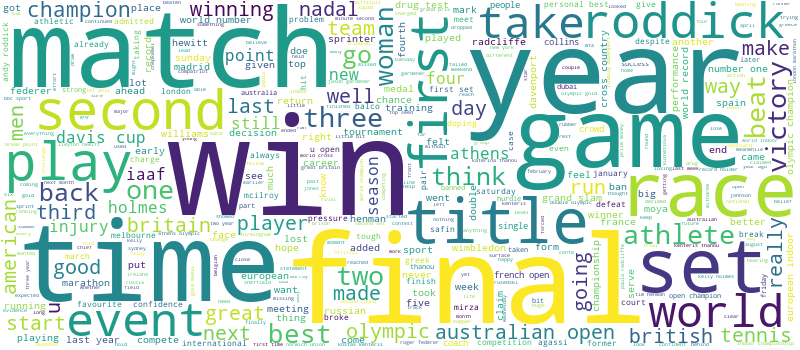

In [75]:
draw_wordcloud(data.text[data['KMeans']==7])

озоглавим как 'films'

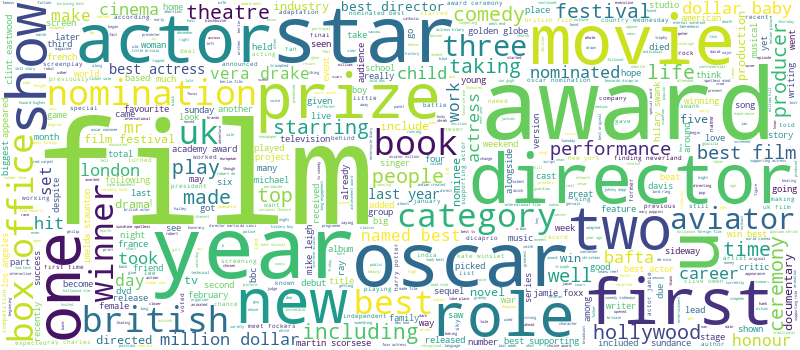

In [88]:
draw_wordcloud(data.text[data['KMeans']==7])

**Ответ:** Темы получаются интерпертируемымиЮ можно заметить, что при увеличении количества класстеров лгоримт начинает искать более подробные темы, н-р: British politics, Russian business

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны. Согласуются ли полученные слова с облаками тегов из прошлого задания?

In [52]:
from sklearn.metrics import euclidean_distances as euclid

In [67]:
centers = kmeans.cluster_centers_
closest = np.argmin(euclid(X, centers), axis=0)

'politics'

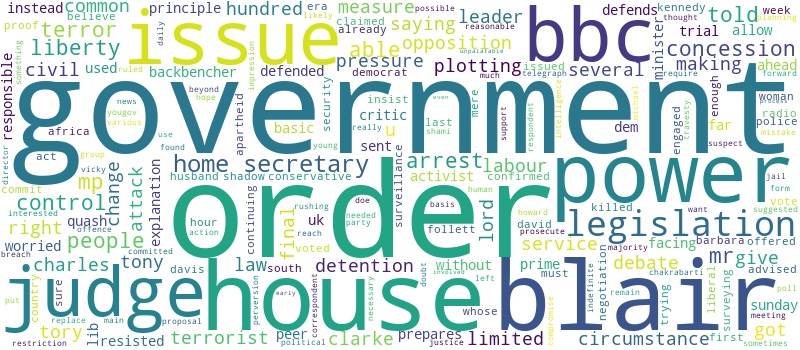

In [78]:
draw_wordcloud(data.text.loc[closest[0]].split())

'British politics'

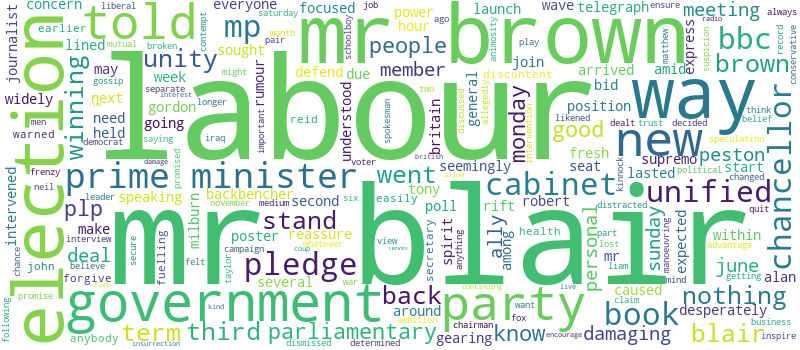

In [82]:
draw_wordcloud(data.text.loc[closest[5]].split())

'technology'

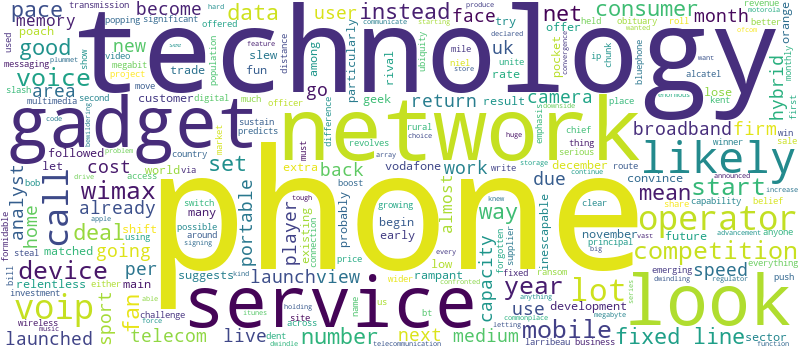

In [83]:
draw_wordcloud(data.text.loc[closest[3]].split())

'films'

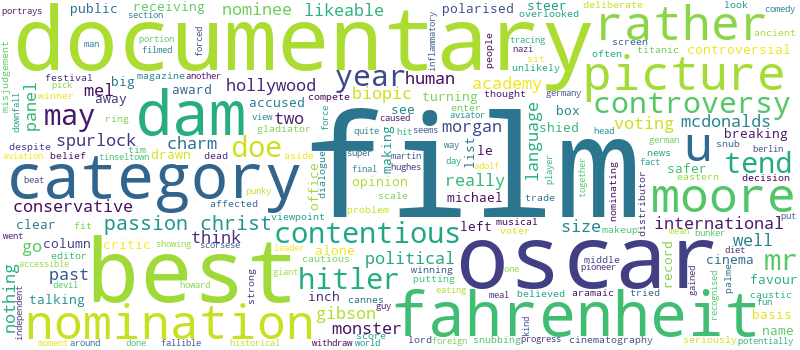

In [84]:
draw_wordcloud(data.text.loc[closest[7]].split())

**Ответ:** Облака тегов совпадают кластеризации совпадают с облаками тегов при поиске ближайших к центрам кластеров текстам 

In [ ]:
**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [89]:
from sklearn.cluster import DBSCAN, SpectralClustering
from sklearn.manifold import TSNE 

In [90]:
tsne = TSNE()
emb = tsne.fit_transform(X)

In [17]:
import matplotlib.pyplot as plt 
import seaborn as sns 
plt.style.use('ggplot')

In [97]:
sc = SpectralClustering(n_clusters=8, n_components=5)
labels_sc = sc.fit_predict(X)

In [105]:
dbscan = DBSCAN(eps=1.24)
labels_dbscan = dbscan.fit_predict(X)
c = np.unique(labels_dbscan).shape[0]

In [102]:
d = {'x' : emb[:, 0], 'y': emb[:, 1], 'KMeans': labels_kmeans, 'Spectral': labels_sc, 'DBSCAN': labels_dbscan}
df_visual = pd.DataFrame(data=d)
df_visual.head()

,x,y,KMeans,Spectral,DBSCAN
0,38.971657,-12.741159,1,1,0
1,59.376587,14.986740,6,1,0
2,57.966549,29.870068,1,1,0
3,45.392273,-13.607714,1,1,0
4,27.830370,-5.915851,1,1,0


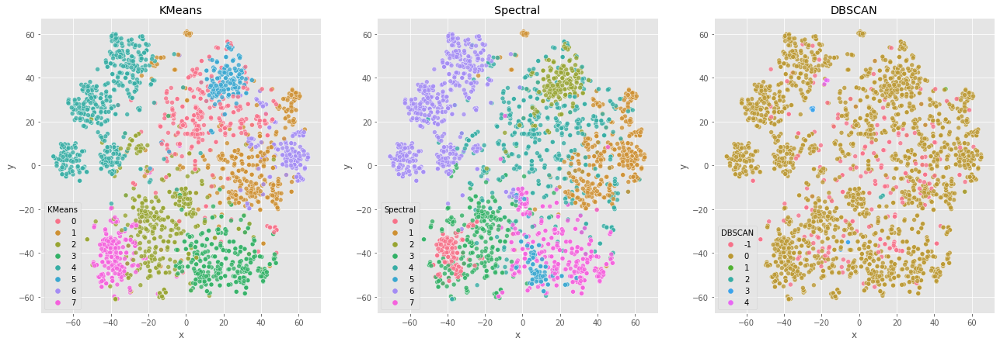

In [107]:
plt.figure(figsize=(22, 7))
ax1 = plt.subplot(1, 3, 1)
ax1.set_title('KMeans')
sns.scatterplot(x='x', y='y', hue='KMeans', data=df_visual, palette=sns.color_palette("husl", n_colors=8), alpha=0.8, ax=ax1)

ax2 = plt.subplot(1, 3, 2)
ax2.set_title('Spectral')
sns.scatterplot(x='x', y='y', hue='Spectral', data=df_visual, palette=sns.color_palette("husl", n_colors=8), alpha=0.8, ax=ax2)

ax3 = plt.subplot(1, 3, 3)
ax3.set_title('DBSCAN')
sns.scatterplot(x='x', y='y', hue='DBSCAN', data=df_visual, palette=sns.color_palette("husl", n_colors=c), alpha=0.8, ax=ax3)
plt.show()

Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:** Кластеры получаются примерно одинаково сбалансированными, только у DBSCAN возникают проблемы с кластеризацией тем, это можт быть связанно с тем, что из tf-idf сложно вычленить плотности отдельных тематик.
Баланс кластеров у KMeans и Спектральной кластеризации получился похожим, однако у DBSCAN центр класстеров смещен в пользу нулевого кластера

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means. Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

In [124]:
from sklearn.decomposition import LatentDirichletAllocation as LDA
from sklearn.feature_extraction.text import CountVectorizer

In [337]:
cv = CountVectorizer()
X_lda = cv.fit_transform(data['text'])

In [349]:
lda = LDA(n_components=14)
dist_lda = lda.fit_transform(X_lda)
labels_lda = np.argmax(dist_lda, axis=1)

Мы будем выделять  кластер с помощью функции `argmax`, таким образазом выделяя наиболее вероятный из всех возможных кластеров

In [353]:
data['LDA'] = labels_lda
data.head()

,category,filename,text,predicted labels,LDA
0,business,001.txt,ad sale boost time warner profit quarterly pro...,2,11
1,business,002.txt,dollar gain greenspan speech dollar hit highes...,2,11
2,business,003.txt,yukos unit buyer face loan claim owner embattl...,2,10
3,business,004.txt,high fuel price hit ba profit british airway b...,2,11
4,business,005.txt,pernod takeover talk lift domecq share uk drin...,2,8


можно озаглавить как 'Policymaking'

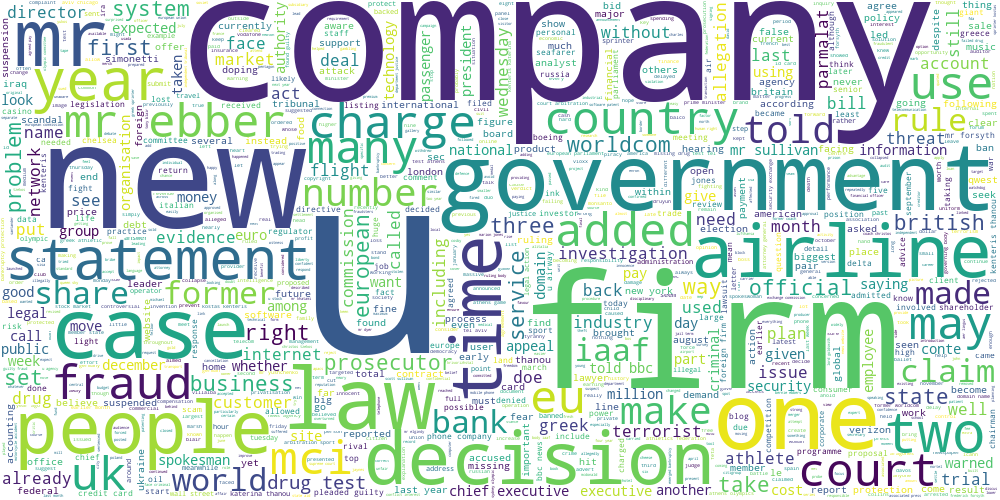

In [355]:
draw_wordcloud(data.text[data['LDA'] == 0])

озаглавим как 'Politics'

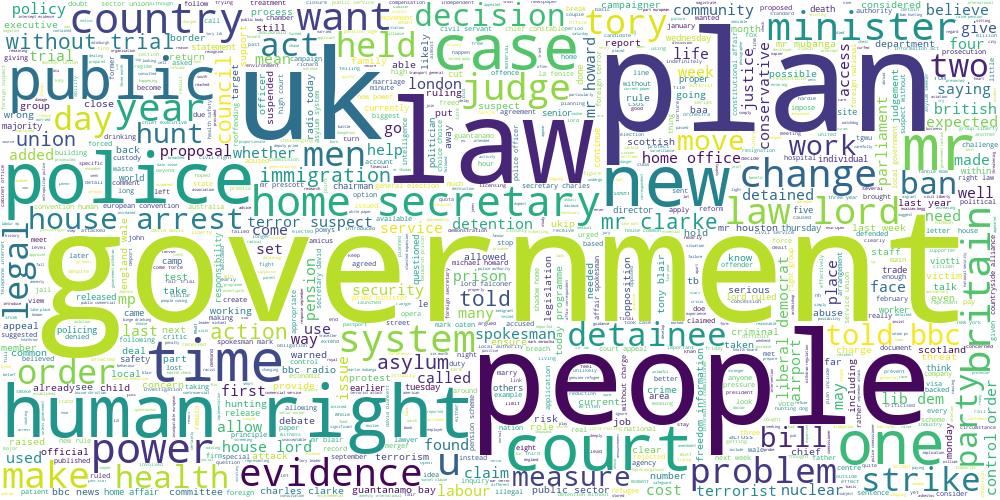

In [356]:
draw_wordcloud(data.text[data['LDA'] == 5])

topic: 
Business with Russia

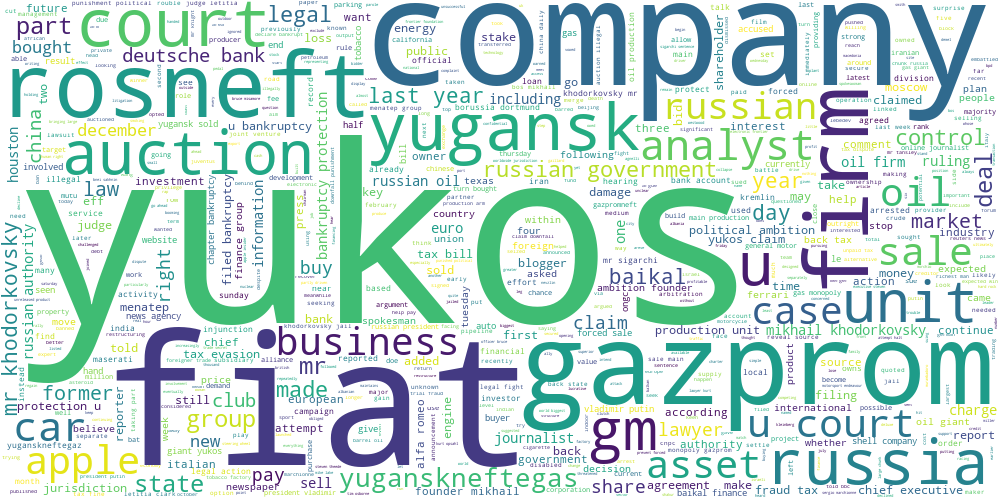

In [357]:
draw_wordcloud(data.text[data['LDA'] == 10])

**Ответ:** LDA выделяет темы подробнее, уведичивать количество компонент. Так, например, из спорта можно выделить футбол, из политики – британскую политику, а из бизнеса – Российский бизнес, нефтяную отрасль

## Часть 3. Transfer learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [28]:
df3 = data[['category', 'text']]
df3.head()

,category,text
0,business,ad sale boost time warner profit quarterly pro...
1,business,dollar gain greenspan speech dollar hit highes...
2,business,yukos unit buyer face loan claim owner embattl...
3,business,high fuel price hit ba profit british airway b...
4,business,pernod takeover talk lift domecq share uk drin...


In [29]:
WORD2IDX = {word: idx for idx, word in enumerate(np.unique(df3.category.values))}
WORD2IDX

{'business': 0, 'entertainment': 1, 'politics': 2, 'sport': 3, 'tech': 4}

In [30]:
def _word2idx(word):
    return WORD2IDX[word]

In [31]:
df3['label'] = df3['category'].apply(_word2idx) #.values
df3.head()

,category,text,label
0,business,ad sale boost time warner profit quarterly pro...,0
1,business,dollar gain greenspan speech dollar hit highes...,0
2,business,yukos unit buyer face loan claim owner embattl...,0
3,business,high fuel price hit ba profit british airway b...,0
4,business,pernod takeover talk lift domecq share uk drin...,0


In [34]:
from sklearn.model_selection import train_test_split
df3_train, df3_test, y_train, y_test = train_test_split(df3['text'], df3['label'], train_size=.7)

Model №1: LogReg

In [160]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(min_df=15)
X_train = tfidf.fit_transform(df3_train)
X_test = tfidf.transform(df3_test)

In [161]:
from sklearn.linear_model import LogisticRegression as LogReg

classifier = LogReg()
classifier.fit(X_train, y_train)
print('Train accuracy: {:.3f}'.format(classifier.score(X_train, y_train)))
print('Test accuracy: {:.3f}'.format(classifier.score(X_test, y_test)))

Train accuracy: 0.994
Test accuracy: 0.982


Model №2: KMeans + LogReg

In [144]:
tfidf = TfidfVectorizer(min_df=15)
X_Kmeans = tfidf.fit_transform(df3['text'])

In [146]:
km = KMeans(n_clusters=5)
center_dist = km.fit_transform(X_Kmeans)

In [148]:
df2_train, df2_test, y_train2, y_test2 = train_test_split(center_dist, df3['label'], train_size=.7)

In [149]:
cl_3 = LogReg()
cl_3.fit(df2_train, y_train2)
print('Train accuracy: {:.3f}'.format(cl_3.score(df2_train, y_train2)))
print('Test accuracy: {:.3f}'.format(cl_3.score(df2_test, y_test2)))

Train accuracy: 0.826
Test accuracy: 0.811


Model №3: LDA + LogReg

In [154]:
from sklearn.feature_extraction.text import CountVectorizer

In [162]:
cv = CountVectorizer()
X_train3 = cv.fit_transform(df3_train)
X_test3 = cv.transform(df3_test)

In [171]:
lda = LDA(n_components=16)
lda_train = lda.fit_transform(X_train3)
lda_test = lda.transform(X_test3)

In [172]:
cl_3 = LogReg()
cl_3.fit(lda_train, y_train)
print('Train accuracy: {:.3f}'.format(cl_3.score(lda_train, y_train)))
print('Test accuracy: {:.3f}'.format(cl_3.score(lda_test, y_test)))

Train accuracy: 0.865
Test accuracy: 0.946


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:** Лучшее качество получилось на модели Log-Reg на tf-idf. Это может быть связано с тем, что в первом случае у логистической регрессии максимуми признаков. Вторым по уровню качества идет LDA (16 признаков), 3м - kmeans (8 признаков). Больше признков позволяет логистической регрессии улавливать закономерность более точно 

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации. 

In [283]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.linear_model import LogisticRegression

In [284]:
df3.head()

,category,text,label
0,business,ad sale boost time warner profit quarterly pro...,0
1,business,dollar gain greenspan speech dollar hit highes...,0
2,business,yukos unit buyer face loan claim owner embattl...,0
3,business,high fuel price hit ba profit british airway b...,0
4,business,pernod takeover talk lift domecq share uk drin...,0


In [285]:
XTrain, XTest, YTrain, YTest = train_test_split(df3['text'], df3['label'], train_size=.7)
X_train_both, XVal, Y_train_both,  YVal = train_test_split(XTrain, YTrain, train_size=0.7)
X_unlabeld, X_labeld, _, Y_labeld = train_test_split(X_train_both, Y_train_both, train_size=0.93)

Tf-Idf + LogReg

In [286]:
tfidf = TfidfVectorizer(min_df=15)
tfidf.fit(X_train_both)

TfidfVectorizer(min_df=15)

In [305]:
X_labeld_tfidf = tfidf.transform(X_labeld)
XVal_tfidf = tfidf.transform(XVal)
XTest_tfidf = tfidf.transform(XTest)

In [372]:
lr = LogisticRegression()
lr.fit(X_labeld_tfidf, Y_labeld)
print("Val accuracy: {:.3f}".format(lr.score(XVal_tfidf, YVal)))

Val accuracy: 0.750


In [373]:
print("Test accuracy: {:.3f}".format(lr.score(XTest_tfidf, YTest)))

Test accuracy: 0.793


LDA + LogReg

In [317]:
cv = CountVectorizer(min_df=15)
cv.fit(X_train_both)

CountVectorizer(min_df=15)

In [318]:
cv = CountVectorizer(min_df=15)
X_train_both_cv = cv.fit_transform(X_train_both)

X_labeld_cv = cv.transform(X_labeld)
XVal_cv = cv.transform(XVal)
XTest_cv = cv.transform(XTest)

In [369]:
lda = LatentDirichletAllocation(n_components=12)
lda.fit(X_train_both_cv)

X_labeld_lda = lda.transform(X_labeld_cv)
XVal_lda = lda.transform(XVal_cv)
XTest_lda = lda.transform(XTest_cv)

In [370]:
lr = LogisticRegression()
lr.fit(X_labeld_lda, Y_labeld)
print("Val accuracy: {:.3f}".format(lr.score(XVal_lda, YVal)))

Val accuracy: 0.940


In [371]:
print("Test accuracy: {:.3f}".format(lr.score(XTest_lda, YTest)))

Test accuracy: 0.934


Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:** Качество ухудшилось по стравнению с suprvised методами, но совместная предобработка позволяет обучить модель качественно даже на небольшом количесве данных. В данном случае качество на tf-idf + LogReg хуже, чем при использоваии LDA. Получается, что unsupervised методы позволяют вовысить качество в случае малого количества разметки 

## Бонус

**Задание 4 (1 балл)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

In [116]:
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import TfidfVectorizer

In [117]:
XTrain, XTest, YTrain, YTest = train_test_split(df3['text'], df3['label'], train_size=.7)
X_train_both, XVal, Y_train_both,  YVal = train_test_split(XTrain, YTrain, train_size=0.7)
X_unlabel, X_label, _, Y_label = train_test_split(X_train_both, Y_train_both, train_size=0.93)

In [118]:
tf = TfidfVectorizer(min_df=10)
tf.fit(X_train_both)

X_tf_unlabel = tf.transform(X_unlabel)
X_tf_label = tf.transform(X_label)
XVal_tf = tf.transform(XVal)

In [126]:
nolabel = [-1 for _ in X_unlabeld]

XTrain_mixed = np.concatenate((X_tf_label.todense(), X_tf_unlabel.todense()))
YTrain_mixed = np.concatenate((Y_label, nolabel))

Сначала посмотрим на `LabelPropogation`

In [206]:
from sklearn.semi_supervised import LabelPropagation

model_1 = LabelPropagation(gamma=25)
model_2 = LogisticRegression()

model_1.fit(XTrain_mixed, YTrain_mixed)
new_labels = model_1.transduction_
model_2.fit(XTrain_mixed, new_labels)
print("Validation accuracy: {:.3f}".format(model_2.score(XVal_tf, YVal)))

Validation accuracy: 0.940


In [207]:
XTest_tf = tf.transform(XTest)
print("Test accuracy: {:.3f}".format(model_2.score(XTest_tf, YTest)))

Test accuracy: 0.934


Теперь сравним результаты `LabelPropogation` с `SelfTrainingClassifier`

In [190]:
from sklearn.semi_supervised import SelfTrainingClassifier

lr = LogisticRegression(C=2.6)
stc = SelfTrainingClassifier(lr, threshold=0.279)
stc.fit(XTrain_mixed, YTrain_mixed)
print("Validation accuracy: {:.3f}".format(stc.score(XVal_tf, YVal)))

Validation accuracy: 0.942


In [191]:
XTest_tf = tf.transform(XTest)
print("Test accuracy: {:.3f}".format(stc.score(XTest_tf, YTest)))

Test accuracy: 0.924


Оба метода показывают сопоставимо хороший результат (accuracy > 0.9 на тестовой выборке). Стоит отметить, что эти методы по качеству также сопоставимы с LDA из предыдущего пункта. 

**Задание 5 (1 балл)**. На занятиях мы обсуждали, что метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

Пстроим новые эмбеддинги 

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии. Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое. Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***. 

В исходном датасете 100 классов, мы будем пытаться кластеризовать на меньшее количество кластеров 

In [1]:
import tensorflow as tf
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar100.load_data(label_mode="fine")

/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:529: FutureWarning: Passi

Пстроим новые эмбеддинги 

In [56]:
from sklearn.decomposition import KernelPCA
kpca = KernelPCA(n_components=300)
X = kpca.fit_transform(x_train.reshape(50000, -1)[:10000])

In [69]:
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE 

n_clusters = 25
KMeans = KMeans(n_clusters=n_clusters)
tsne = TSNE(n_components=2)

labels = KMeans.fit_predict(X)
emb_2 = tsne.fit_transform(X)

In [70]:
D = {'X' : emb_2[:, 0], 'Y': emb_2[:, 1], 'KMeans': labels}
df_visual_2 = pd.DataFrame(data=D)
df_visual_2.head()

,X,Y,KMeans
0,23.407885,-3.988235,9
1,39.187130,38.325504,11
2,39.310108,20.478691,4
3,21.333269,28.891085,21
4,-24.523573,-12.185481,17


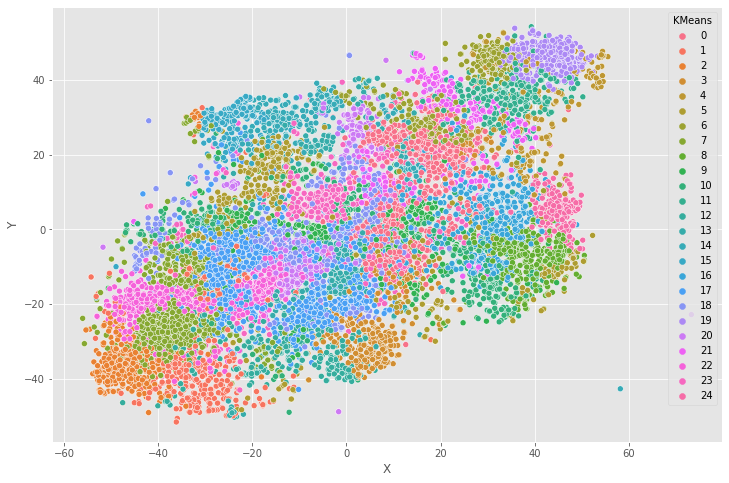

In [71]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x='X', y='Y', hue='KMeans', data=df_visual_2, palette=sns.color_palette("husl", n_clusters))
None

можно заметить, что некоторые класстеры получились плотными, например, `2, 4, 19, 22`. Другие полочилисьь менее плотными. Посмотрим на изображения из плотных классов

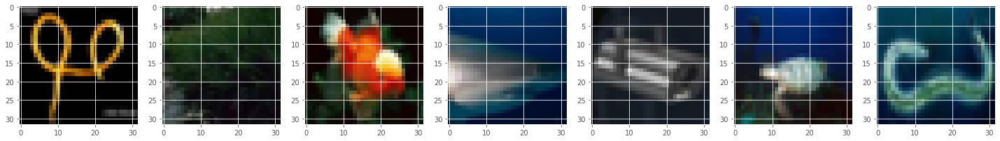

In [72]:
idx = np.random.choice(df_visual_2[df_visual_2.KMeans==2].index, 7)

plt.figure(figsize=(25, 5))
for i in range(7):
    _ = plt.subplot(1, 7, i+1)
    plt.imshow(x_train[idx][i], )

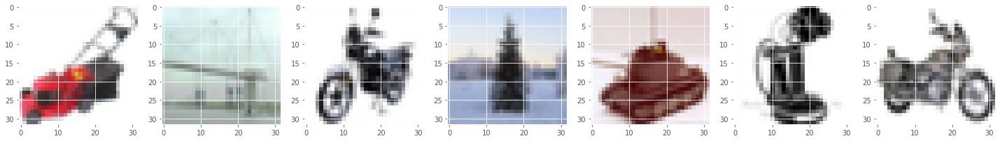

In [73]:
idx = np.random.choice(df_visual_2[df_visual_2.KMeans==4].index, 7)

plt.figure(figsize=(25, 5))
for i in range(7):
    _ = plt.subplot(1, 7, i+1)
    plt.imshow(x_train[idx][i], )

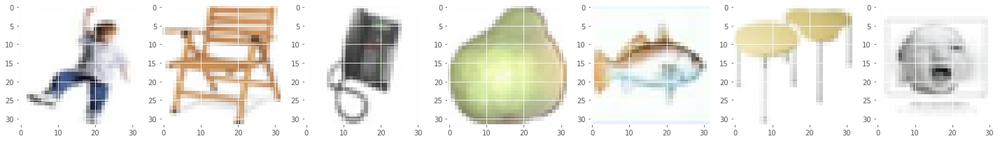

In [74]:
idx = np.random.choice(df_visual_2[df_visual_2.KMeans==19].index, 7)

plt.figure(figsize=(25, 5))
for i in range(7):
    _ = plt.subplot(1, 7, i+1)
    plt.imshow(x_train[idx][i])

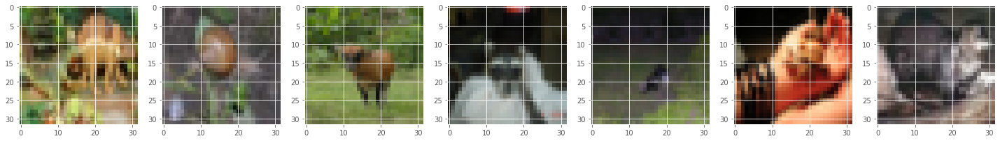

In [75]:
idx = np.random.choice(df_visual_2[df_visual_2.KMeans==22].index, 7)

plt.figure(figsize=(25, 5))
for i in range(7):
    _ = plt.subplot(1, 7, i+1)
    plt.imshow(x_train[idx][i])

**Вывод:** Можно сделать любопытный вывод: алгоритм действительно кластеризует картинки, однако он делает это, исходя не из содержания картинок, а изходя из стиля, так как именно такая информация наиболее эффективно выделяется из тензоров. 

**Задание 7 (1e-100 балла)**. Опишите свои ощущения от этой домашки, поощряется сравнение с предыдущей.

норм, интересно, не сложно, прошлая была сложнее